# Data: Breast Cancer (https://www.kaggle.com/uciml/breast-cancer-wisconsin-data)
### Problem: Classification (Malignant or Benign)
### Scope:
- Cleaning: no
- Outlier: yes
- NaN: no
- Feature engineering: yes
- Scaling: yes
- Model building: yes
- Model evaluation: yes
- Best model? : no

Initialize libs

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [3]:
cancer = pd.read_csv('C:/Users/lenovo/Downloads/my notebook/cancer_data.csv')

# EDA

In [4]:
cancer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [5]:
cancer.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [6]:
cancer.iloc[:,-1]

0     NaN
1     NaN
2     NaN
3     NaN
4     NaN
       ..
564   NaN
565   NaN
566   NaN
567   NaN
568   NaN
Name: Unnamed: 32, Length: 569, dtype: float64

In [7]:
cancer['id'].nunique()

569

In [8]:
cancer.drop(['Unnamed: 32', 'id'], axis = 1, inplace = True)

In [9]:
cancer.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [10]:
def out_iqr(df, col):
    iqr = df[col].describe()['75%'] - df[col].describe()['25%']
    lower = df[col].describe()['25%'] - 1.5*iqr
    higher = df[col].describe()['75%'] + 1.5*iqr
    
    n_out = len(df[col]) - df[(df[col]<lower)|(df[col]<higher)].shape[0]
    n_pct = round(n_out/len(df[col])*100, 2)
    
    return 'n outlier in {}: {} records, {} percent'.format(col, n_out, n_pct)

In [11]:
for column in cancer.columns[1:]:
    print(out_iqr(cancer, column))

n outlier in radius_mean: 14 records, 2.46 percent
n outlier in texture_mean: 7 records, 1.23 percent
n outlier in perimeter_mean: 13 records, 2.28 percent
n outlier in area_mean: 25 records, 4.39 percent
n outlier in smoothness_mean: 5 records, 0.88 percent
n outlier in compactness_mean: 16 records, 2.81 percent
n outlier in concavity_mean: 18 records, 3.16 percent
n outlier in concave points_mean: 10 records, 1.76 percent
n outlier in symmetry_mean: 14 records, 2.46 percent
n outlier in fractal_dimension_mean: 15 records, 2.64 percent
n outlier in radius_se: 38 records, 6.68 percent
n outlier in texture_se: 20 records, 3.51 percent
n outlier in perimeter_se: 38 records, 6.68 percent
n outlier in area_se: 65 records, 11.42 percent
n outlier in smoothness_se: 30 records, 5.27 percent
n outlier in compactness_se: 28 records, 4.92 percent
n outlier in concavity_se: 22 records, 3.87 percent
n outlier in concave points_se: 19 records, 3.34 percent
n outlier in symmetry_se: 27 records, 4.75

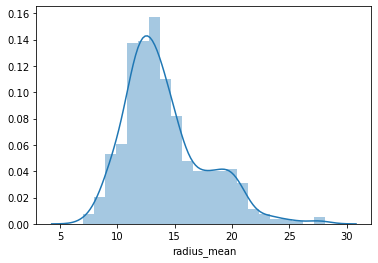

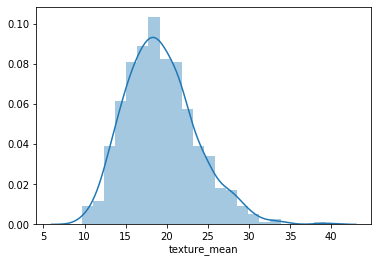

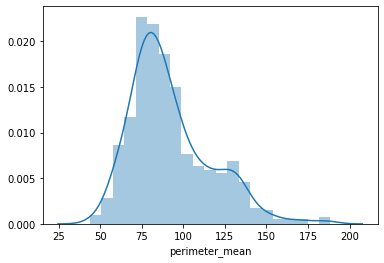

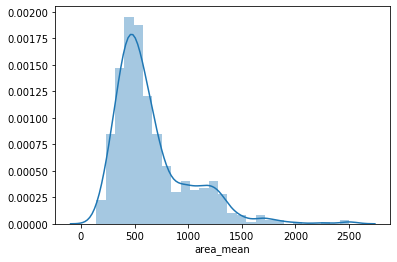

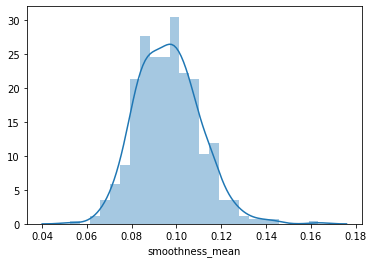

...

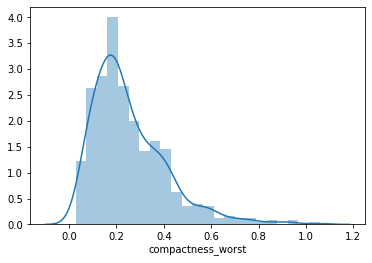

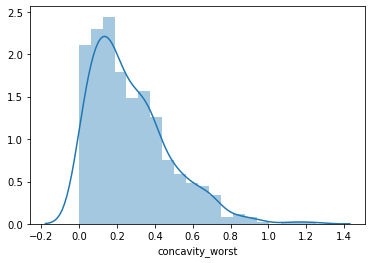

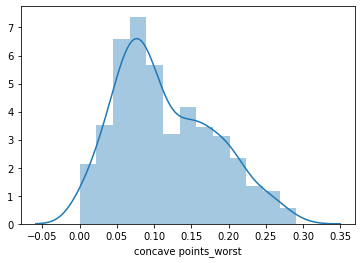

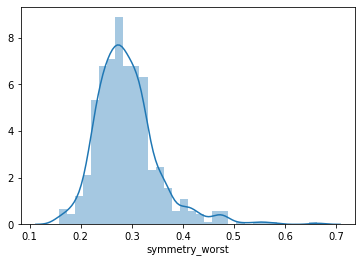

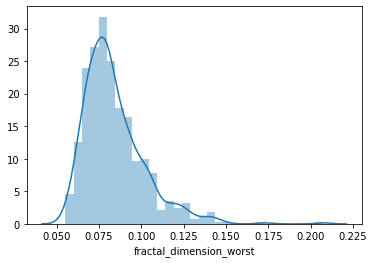

In [12]:
for column in cancer.columns[1:]:
    sns.distplot(cancer[column])
    plt.show()

In [13]:
from scipy.stats import shapiro, normaltest, anderson
def try_normal(data):
    result = {'Anderson' : {i:j for i,j in zip(anderson(data)[2], anderson(data)[1])}, 'Shapiro': shapiro(data)[1], 
     'K^2': normaltest(data)[1]}
    result['Anderson']['stat'] = anderson(data)[0]
    return result

In [14]:
for column in cancer.columns[1:]:
    print('{}'.format(column), try_normal(cancer[column]))

radius_mean {'Anderson': {15.0: 0.572, 10.0: 0.651, 5.0: 0.782, 2.5: 0.912, 1.0: 1.084, 'stat': 10.823153591015966}, 'Shapiro': 3.1061551985026026e-14, 'K^2': 1.286172249506454e-16}
texture_mean {'Anderson': {15.0: 0.572, 10.0: 0.651, 5.0: 0.782, 2.5: 0.912, 1.0: 1.084, 'stat': 2.5528180484525365}, 'Shapiro': 7.281473557441132e-08, 'K^2': 4.685882796961145e-10}
perimeter_mean {'Anderson': {15.0: 0.572, 10.0: 0.651, 5.0: 0.782, 2.5: 0.912, 1.0: 1.084, 'stat': 11.502471936983738}, 'Shapiro': 7.01163031715385e-15, 'K^2': 3.595463394731772e-18}
area_mean {'Anderson': {15.0: 0.572, 10.0: 0.651, 5.0: 0.782, 2.5: 0.912, 1.0: 1.084, 'stat': 23.509675803695245}, 'Shapiro': 3.196511088521129e-22, 'K^2': 2.3860403182400484e-42}
smoothness_mean {'Anderson': {15.0: 0.572, 10.0: 0.651, 5.0: 0.782, 2.5: 0.912, 1.0: 1.084, 'stat': 0.9822518141355658}, 'Shapiro': 8.59934589243494e-05, 'K^2': 6.925619033399656e-07}
compactness_mean {'Anderson': {15.0: 0.572, 10.0: 0.651, 5.0: 0.782, 2.5: 0.912, 1.0: 1.0

distribution ga ada yang normal, dan has outliers, but let's not scale anything for now

let's pare down features from 30 to 10

In [15]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
cancer.iloc[:,0] = label_encoder.fit_transform(cancer.iloc[:,0]).astype('float64')
cancer['diagnosis'].unique()

array([1., 0.])

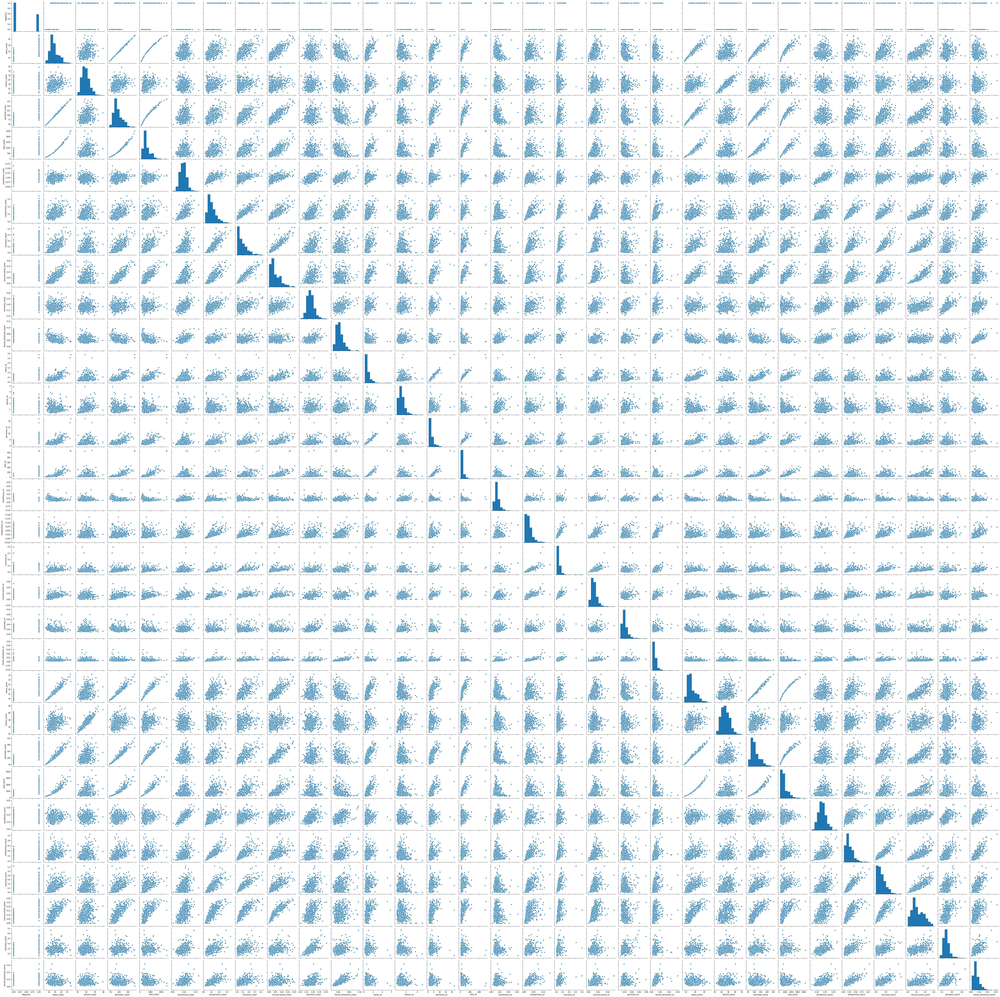

In [16]:
sns.pairplot(cancer)

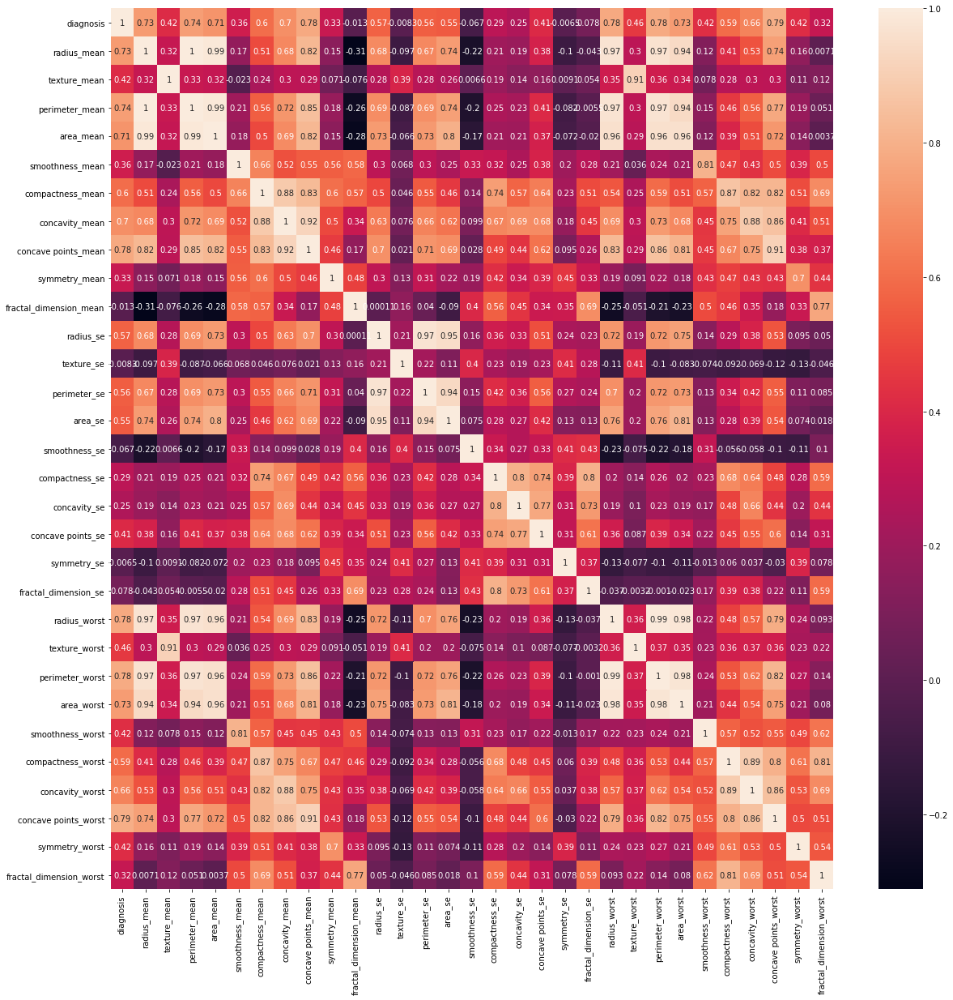

In [17]:
plt.figure(figsize = (20, 20))
sns.heatmap(cancer.corr(), annot = True)

In [18]:
pd.Series(abs(cancer.corr()['diagnosis']).sort_values(ascending = False)[1:11].index)

0    concave points_worst
1         perimeter_worst
2     concave points_mean
3            radius_worst
4          perimeter_mean
5              area_worst
6             radius_mean
7               area_mean
8          concavity_mean
9         concavity_worst
dtype: object

In [19]:
pd.Series(abs(cancer.corr('spearman')['diagnosis']).sort_values(ascending = False)[1:11].index)

0         perimeter_worst
1            radius_worst
2              area_worst
3    concave points_worst
4     concave points_mean
5          perimeter_mean
6               area_mean
7          concavity_mean
8             radius_mean
9                 area_se
dtype: object

yang beda cuman concativity worst vs area se

In [20]:
# define features & target
X = cancer.iloc[:, 1:31]
y = cancer.iloc[:, 0]

In [21]:
# Feature Importance

from sklearn.ensemble import ExtraTreesClassifier

model = ExtraTreesClassifier()
model.fit(X, y)
feat_imp = pd.DataFrame(data = zip(X.columns, model.feature_importances_),
                        columns = ['Feature', 'Importance']).nlargest(10, 'Importance')
feat_imp['RankImp'] = [i for i in range(1, 11)]
feat_imp

,Feature,Importance,RankImp
27,concave points_worst,0.107511,1
22,perimeter_worst,0.093406,2
7,concave points_mean,0.085282,3
6,concavity_mean,0.077739,4
0,radius_mean,0.073928,5
20,radius_worst,0.072900,6
23,area_worst,0.066231,7
2,perimeter_mean,0.058890,8
3,area_mean,0.051275,9
26,concavity_worst,0.041084,10


 Corr spearman compared to importance
 Top 10 all match

 * 0         perimeter_worst 2
 * 1            radius_worst 5
 * 2              area_worst 4
 * 3    concave points_worst 3
 * 4     concave points_mean 1
 * 5          perimeter_mean 6
 * 6               area_mean 8
 * 7          concavity_mean 7
 * 8             radius_mean 9
 * 9                 area_se 10

Let's keep those and drop else

In [22]:
[i for i in feat_imp['Feature']]

['concave points_worst',
 'perimeter_worst',
 'concave points_mean',
 'concavity_mean',
 'radius_mean',
 'radius_worst',
 'area_worst',
 'perimeter_mean',
 'area_mean',
 'concavity_worst']

In [23]:
X = cancer[['concave points_mean',
 'perimeter_worst',
 'concave points_worst',
 'area_worst',
 'radius_worst',
 'perimeter_mean',
 'concavity_mean',
 'area_mean',
 'radius_mean',
 'area_se']]

In [24]:
X.describe()

# area, perimeter stands out as large values

,concave points_mean,perimeter_worst,concave points_worst,area_worst,radius_worst,perimeter_mean,concavity_mean,area_mean,radius_mean,area_se
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,0.048919,107.261213,0.114606,880.583128,16.269190,91.969033,0.088799,654.889104,14.127292,40.337079
std,0.038803,33.602542,0.065732,569.356993,4.833242,24.298981,0.079720,351.914129,3.524049,45.491006
min,0.000000,50.410000,0.000000,185.200000,7.930000,43.790000,0.000000,143.500000,6.981000,6.802000
25%,0.020310,84.110000,0.064930,515.300000,13.010000,75.170000,0.029560,420.300000,11.700000,17.850000
50%,0.033500,97.660000,0.099930,686.500000,14.970000,86.240000,0.061540,551.100000,13.370000,24.530000
75%,0.074000,125.400000,0.161400,1084.000000,18.790000,104.100000,0.130700,782.700000,15.780000,45.190000
max,0.201200,251.200000,0.291000,4254.000000,36.040000,188.500000,0.426800,2501.000000,28.110000,542.200000


In [25]:
for column in X.columns:
    print(out_iqr(X, column))
    
# interestingly area_se with the highest outlier pct is selected

n outlier in concave points_mean: 10 records, 1.76 percent
n outlier in perimeter_worst: 15 records, 2.64 percent
n outlier in concave points_worst: 0 records, 0.0 percent
n outlier in area_worst: 35 records, 6.15 percent
n outlier in radius_worst: 17 records, 2.99 percent
n outlier in perimeter_mean: 13 records, 2.28 percent
n outlier in concavity_mean: 18 records, 3.16 percent
n outlier in area_mean: 25 records, 4.39 percent
n outlier in radius_mean: 14 records, 2.46 percent
n outlier in area_se: 65 records, 11.42 percent


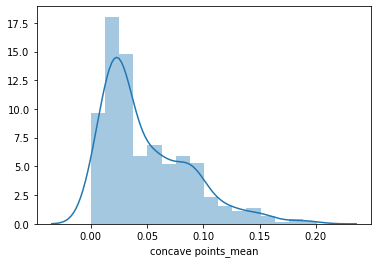

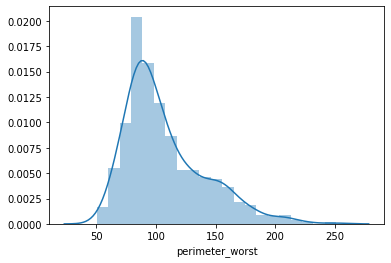

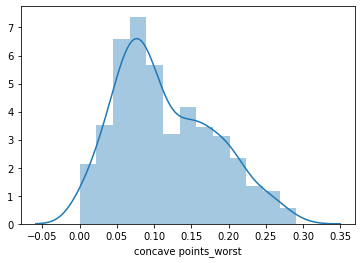

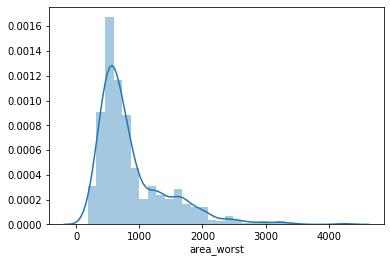

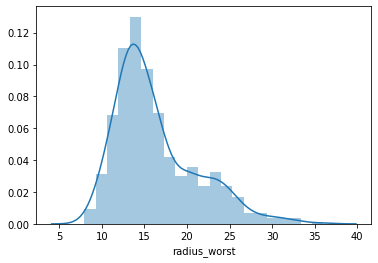

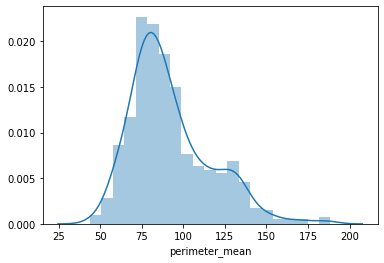

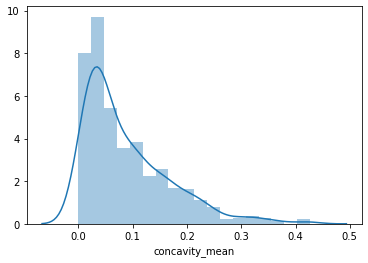

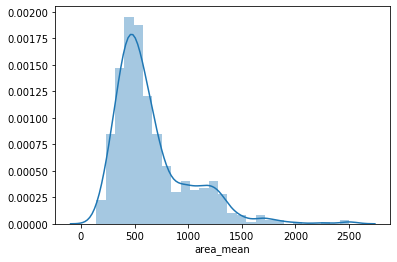

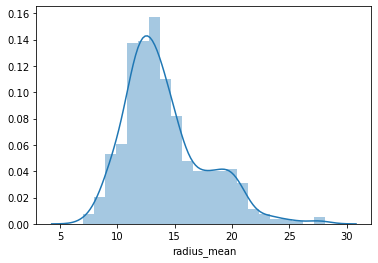

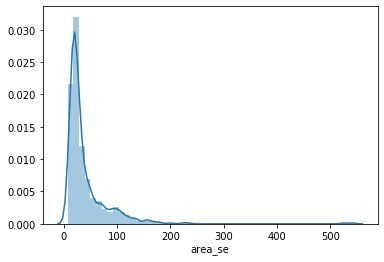

In [26]:
for column in X.columns:
    sns.distplot(X[column])
    plt.show()

In [27]:
# skew
for column in X.columns:
    print(X[column].skew())

1.1711800812336282
1.1281638713683722
0.49261552688550875
1.8593732724433467
1.1031152059604372
0.9906504253930081
1.4011797389486722
1.6457321756240424
0.9423795716730992
5.447186284898394


* 90% features has outliers and not normally distributed
* area and perimeter are not on the same scale as the rest, so we need to level them

Let's scale all features using RobustScaler

In [28]:
from sklearn.preprocessing import RobustScaler

cancer_robust = pd.DataFrame(RobustScaler().fit_transform(X), columns = ['concave points_mean',
 'perimeter_worst',
 'concave points_worst',
 'area_worst',
 'radius_worst',
 'perimeter_mean',
 'concavity_mean',
 'area_mean',
 'radius_mean',
 'area_se'])
cancer_robust['diagnosis'] = y

cancer_robust

,concave points_mean,perimeter_worst,concave points_worst,area_worst,radius_worst,perimeter_mean,concavity_mean,area_mean,radius_mean,area_se,diagnosis
0,2.115850,2.105595,1.715248,2.343063,1.801038,1.263740,2.358711,1.241446,1.132353,4.713606,1.0
1,0.682995,1.480746,0.892194,2.232284,1.733564,1.612859,0.250742,2.138245,1.764706,1.812363,1.0
2,1.758242,1.328167,1.483052,1.797960,1.487889,1.512617,1.343287,1.798841,1.549020,2.542063,1.0
3,1.335444,0.029305,1.633358,-0.208897,-0.010381,-0.299343,1.778327,-0.455298,-0.477941,0.098756,1.0
4,1.318681,1.320901,0.648595,1.562335,1.309689,1.688904,1.349219,2.058223,1.696078,2.557059,1.0
...,...,...,...,...,...,...,...,...,...,...,...
564,1.963122,1.657544,1.261221,2.357130,1.813149,1.927411,1.803045,2.560430,2.007353,4.907462,1.0
565,1.199665,1.388714,0.651705,1.836645,1.508651,1.554096,0.815306,1.958885,1.656863,2.725311,1.0
566,0.363569,0.703318,0.434021,0.769298,0.693772,0.762530,0.306209,0.847130,0.791667,0.878566,1.0
567,2.207115,2.105595,1.711102,1.994901,1.863322,1.861735,2.865928,1.969923,1.772059,2.256401,1.0


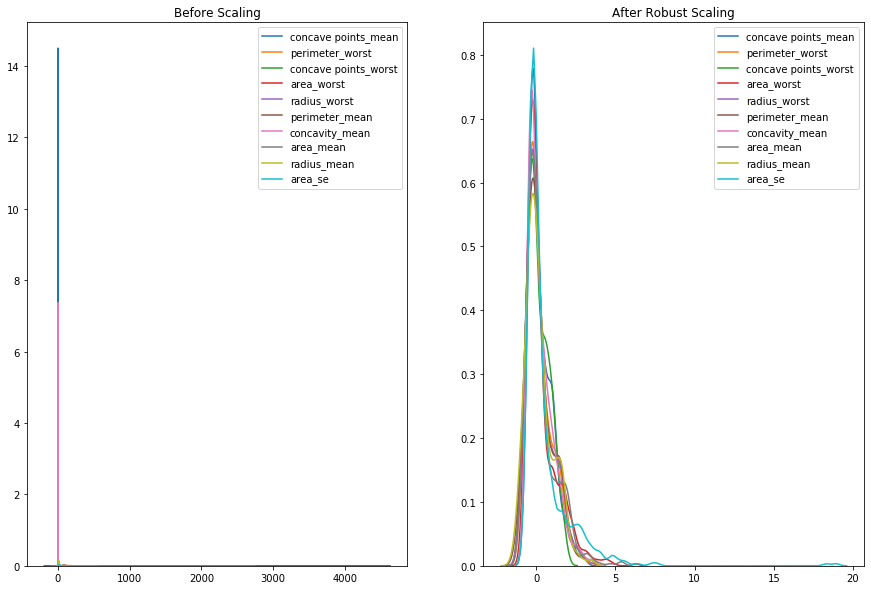

In [29]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 10))
ax1.set_title('Before Scaling')
for column in X.columns:
    sns.kdeplot(cancer[column], ax = ax1)
ax2.set_title('After Robust Scaling')
for column in X.columns:
    sns.kdeplot(cancer_robust[column], ax = ax2)

Notice that after Robust scaling, the distributions are brought into the same scale and overlap, but the outliers remain outside of bulk of the new distributions.

Lets split Train/Test data 80/20

In [30]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(cancer_robust.iloc[:, :11],
                                                cancer_robust.iloc[:, -1],
                                                test_size = 0.20)

for data in [x_train, x_test]:
    print(data.shape[0])

455
114


# Logistic Regression Trial

In [31]:
from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression()
logistic.fit(x_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [32]:
y_pred = logistic.predict(x_test)

In [35]:
score = logistic.score(x_test, y_test)
print(score)

1.0


In [36]:
from sklearn import metrics
accuracy = metrics.accuracy_score(y_test, y_pred)
accuracy_percentage = 100 * accuracy
accuracy_percentage

100.0

In [37]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        75
         1.0       1.00      1.00      1.00        39

    accuracy                           1.00       114
   macro avg       1.00      1.00      1.00       114
weighted avg       1.00      1.00      1.00       114



In [38]:
from sklearn import metrics
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

[[75  0]
 [ 0 39]]


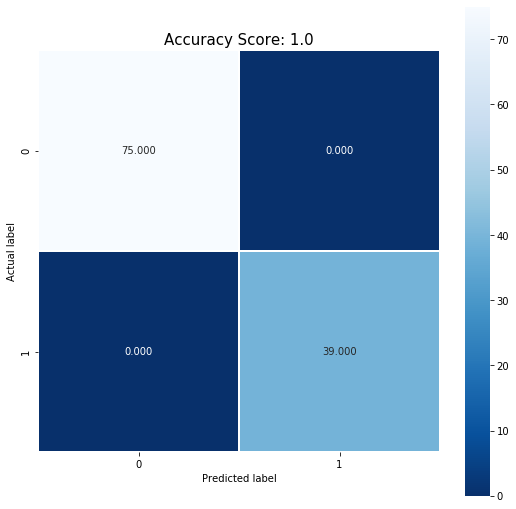

In [39]:
plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

what if features are not scaled?

In [40]:
x_train, x_test, y_train, y_test = train_test_split(cancer[X.columns],
                                                cancer.iloc[:, 0],
                                                test_size = 0.20)

for data in [x_train, x_test]:
    print(data.shape[0])

455
114


In [41]:
from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression()
logistic.fit(x_train, y_train)

C:\Users\lenovo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

data can't be fitted?

Normally when an optimization algorithm does not converge, it is usually because the problem is not well-conditioned, perhaps due to a poor scaling of the decision variables. There are a few things you can try.

Normalize your training data so that the problem hopefully becomes more well conditioned, which in turn can speed up convergence. One possibility is to scale your data to 0 mean, unit standard deviation using Scikit-Learn's StandardScaler for an example. Note that you have to apply the StandardScaler fitted on the training data to the test data.
Related to 1), make sure the other arguments such as regularization weight, C, is set appropriately.
Set max_iter to a larger value. The default is 1000.
Set dual = false if number of features > number of examples and vice versa. This solves the SVM optimization problem using the dual formulation. Thanks @Nino van Hooff for pointing this out.
Use a different solver, for e.g., the L-BFGS solver if you are using Logistic Regression. See @5ervant's answer.
Note: One should not ignore this warning.

# Naive Bayes Trial

* Gaussian: It assumes that continuous features follow a normal distribution.
* Multinomial: It is useful if your features are discrete.
* Bernoulli: The binomial model is useful if your features are binary.

In [42]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

* our features are continuous & scaled to approx normal dist?

In [43]:
model = GaussianNB()
model.fit(x_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [44]:
y_pred = model.predict(x_test)

In [45]:
accuracy = accuracy_score(y_test, y_pred) * 100
accuracy

90.35087719298247

In [46]:
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

[[65  5]
 [ 6 38]]


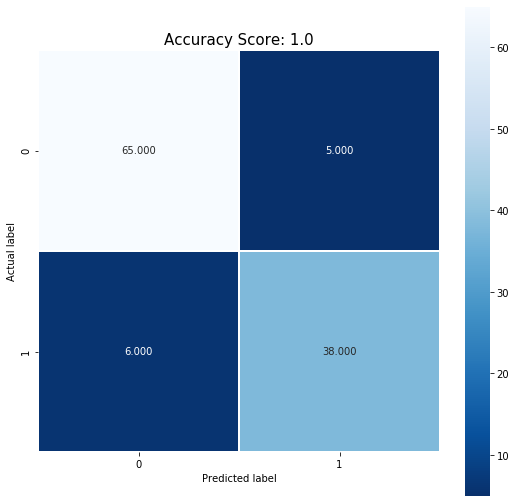

In [47]:
plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

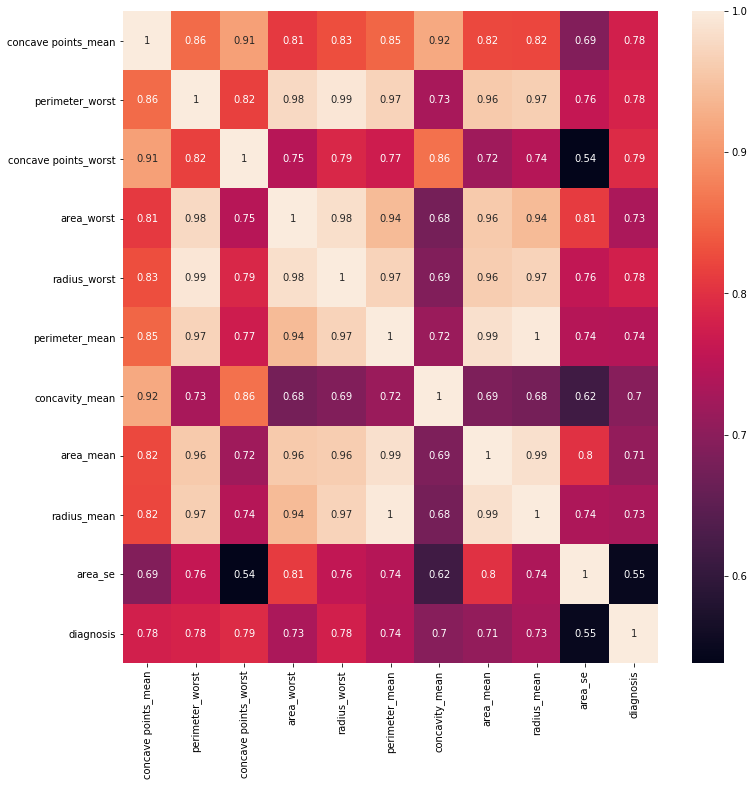

In [49]:
plt.figure(figsize = (12, 12))
sns.heatmap(cancer_robust.corr(), annot = True)

Possibly performancenya kurang bagus dibanding logistic regression, karena antar features ini highly linearly correlated (at least .5x). Jadi Naive Bayes memang kurang cocok karena 'Naive Bayes algorithms assume that there’s no correlation between features in a dataset used to train the model.'

Try again with feats standardized?


In [50]:
from sklearn.preprocessing import StandardScaler

cancer_standard = pd.DataFrame(StandardScaler().fit_transform(X), columns = ['concave points_mean',
 'perimeter_worst',
 'concave points_worst',
 'area_worst',
 'radius_worst',
 'perimeter_mean',
 'concavity_mean',
 'area_mean',
 'radius_mean',
 'area_se'])
cancer_standard['diagnosis'] = y

cancer_standard

,concave points_mean,perimeter_worst,concave points_worst,area_worst,radius_worst,perimeter_mean,concavity_mean,area_mean,radius_mean,area_se,diagnosis
0,2.532475,2.303601,2.296076,2.001237,1.886690,1.269934,2.652874,0.984375,1.097064,2.487578,1.0
1,0.548144,1.535126,1.087084,1.890489,1.805927,1.685955,-0.023846,1.908708,1.829821,0.742402,1.0
2,2.037231,1.347475,1.955000,1.456285,1.511870,1.566503,1.363478,1.558884,1.579888,1.181336,1.0
3,1.451707,-0.249939,2.175786,-0.550021,-0.281464,-0.592687,1.915897,-0.764464,-0.768909,-0.288378,1.0
4,1.428493,1.338539,0.729259,1.220724,1.298575,1.776573,1.371011,1.826229,1.750297,1.190357,1.0
...,...,...,...,...,...,...,...,...,...,...,...
564,2.320965,1.752563,1.629151,2.015301,1.901185,2.060786,1.947285,2.343856,2.110995,2.604187,1.0
565,1.263669,1.421940,0.733827,1.494959,1.536720,1.615931,0.693043,1.723842,1.704854,1.291565,1.0
566,0.105777,0.579001,0.414069,0.427906,0.561361,0.672676,0.046588,0.577953,0.702284,0.180698,1.0
567,2.658866,2.303601,2.289985,1.653171,1.961239,1.982524,3.296944,1.735218,1.838341,1.009503,1.0


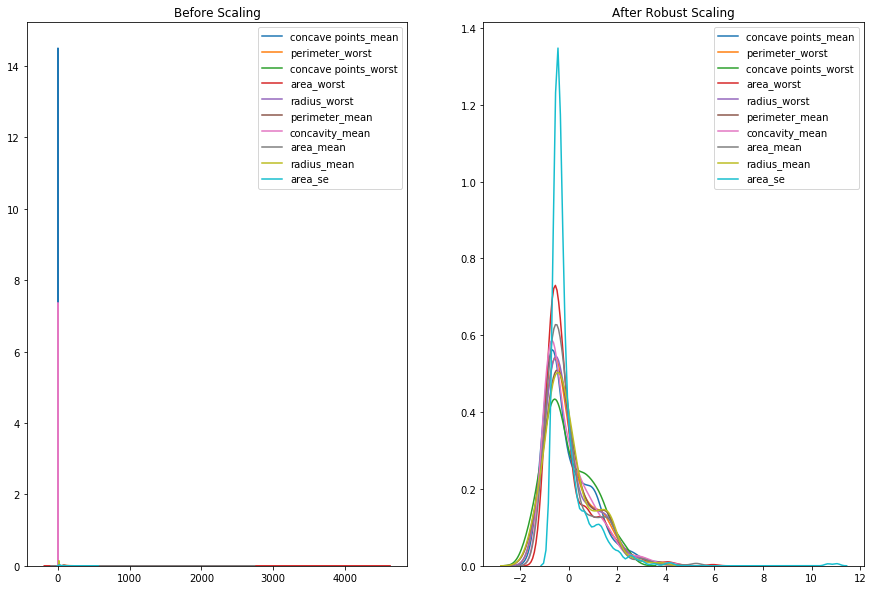

In [51]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 10))
ax1.set_title('Before Scaling')
for column in X.columns:
    sns.kdeplot(cancer[column], ax = ax1)
ax2.set_title('After Robust Scaling')
for column in X.columns:
    sns.kdeplot(cancer_standard[column], ax = ax2)

In [52]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(cancer_standard.iloc[:, :11],
                                                cancer_standard.iloc[:, -1],
                                                test_size = 0.20)

for data in [x_train, x_test]:
    print(data.shape[0])

455
114


In [53]:
model = GaussianNB()
model.fit(x_train, y_train)

y_pred = model.predict(x_test)

accuracy = accuracy_score(y_test, y_pred) * 100
accuracy

100.0

In [54]:
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

[[75  0]
 [ 0 39]]


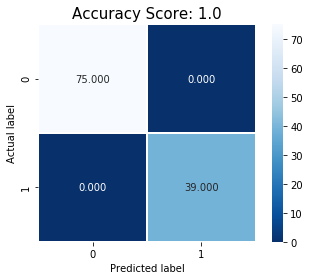

In [55]:
# plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

In [56]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        75
         1.0       1.00      1.00      1.00        39

    accuracy                           1.00       114
   macro avg       1.00      1.00      1.00       114
weighted avg       1.00      1.00      1.00       114



As predicted, performance can be improved if cont feats' distribution is as close to normal as possible. Multicollinearity do not change tho.
'when those dependencies cancel each other out, there is no influence on the classification.' (https://www.cs.unb.ca/~hzhang/publications/FLAIRS04ZhangH.pdf)

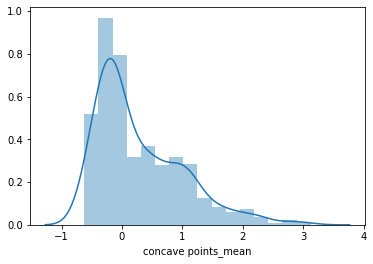

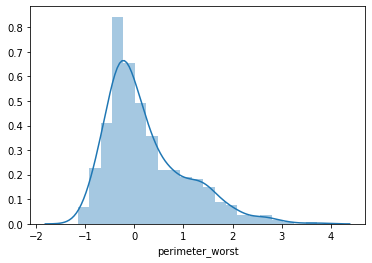

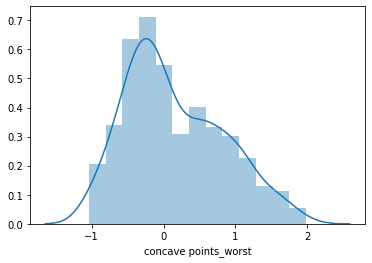

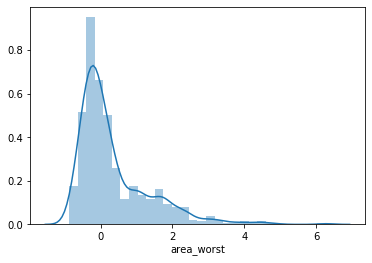

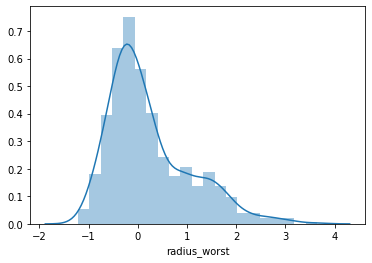

...

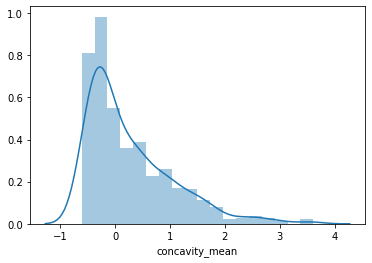

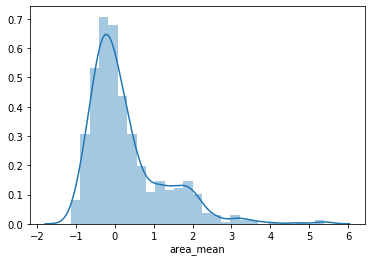

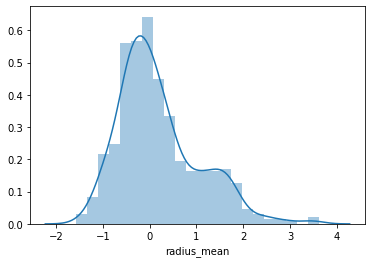

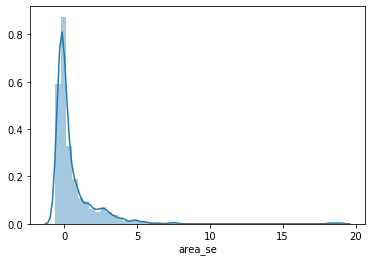

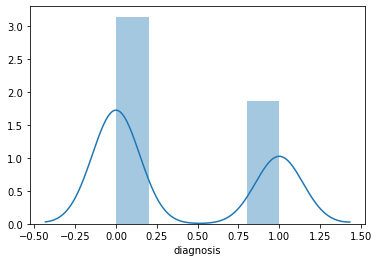

In [58]:
for column in cancer_robust.columns:
    sns.distplot(cancer_robust[column])
    plt.show()

### Pro and cons of Naive Bayes Classifiers
Pros:

* Computationally fast
* Simple to implement
* Works well with small datasets
* Works well with high dimensions
* Perform well even if the Naive Assumption is not perfectly met. In many cases, the approximation is enough to build a good classifier.

Cons:

* Require to remove correlated features because they are voted twice in the model and it can lead to over inflating importance.
* If a categorical variable has a category in test data set which was not observed in training data set, then the model will assign a zero probability. It will not be able to make a prediction. This is often known as “Zero Frequency”. To solve this, we can use the smoothing technique. One of the simplest smoothing techniques is called. Sklearn applies Laplace smoothing by default when you train a Naive Bayes classifier.

# Decision Tree Trial

In [59]:
# use unscaled data?

cancer_original = pd.DataFrame(X, columns = ['concave points_mean',
 'perimeter_worst',
 'concave points_worst',
 'area_worst',
 'radius_worst',
 'perimeter_mean',
 'concavity_mean',
 'area_mean',
 'radius_mean',
 'area_se'])
cancer_original['diagnosis'] = y

cancer_original

,concave points_mean,perimeter_worst,concave points_worst,area_worst,radius_worst,perimeter_mean,concavity_mean,area_mean,radius_mean,area_se,diagnosis
0,0.14710,184.60,0.2654,2019.0,25.380,122.80,0.30010,1001.0,17.99,153.40,1.0
1,0.07017,158.80,0.1860,1956.0,24.990,132.90,0.08690,1326.0,20.57,74.08,1.0
2,0.12790,152.50,0.2430,1709.0,23.570,130.00,0.19740,1203.0,19.69,94.03,1.0
3,0.10520,98.87,0.2575,567.7,14.910,77.58,0.24140,386.1,11.42,27.23,1.0
4,0.10430,152.20,0.1625,1575.0,22.540,135.10,0.19800,1297.0,20.29,94.44,1.0
...,...,...,...,...,...,...,...,...,...,...,...
564,0.13890,166.10,0.2216,2027.0,25.450,142.00,0.24390,1479.0,21.56,158.70,1.0
565,0.09791,155.00,0.1628,1731.0,23.690,131.20,0.14400,1261.0,20.13,99.04,1.0
566,0.05302,126.70,0.1418,1124.0,18.980,108.30,0.09251,858.1,16.60,48.55,1.0
567,0.15200,184.60,0.2650,1821.0,25.740,140.10,0.35140,1265.0,20.60,86.22,1.0


In [60]:
cancer_original['diagnosis'].value_counts()

0.0    357
1.0    212
Name: diagnosis, dtype: int64

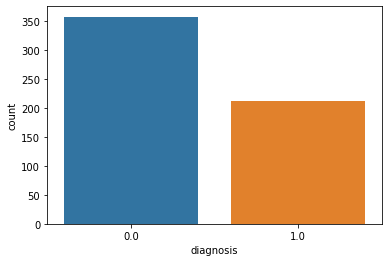

In [61]:
sns.countplot(cancer_original['diagnosis'])

In [62]:
x_train, x_test, y_train, y_test = train_test_split(cancer_original.iloc[:, :10],
                                                cancer_original.iloc[:, -1],
                                                test_size = 0.20)

for data in [x_train, x_test]:
    print(data.shape[0])

455
114


In [78]:
from sklearn import tree

model = tree.DecisionTreeClassifier()
model = model.fit(x_train, y_train)
y_pred = model.predict(x_test)
print('Accuracy: ', metrics.accuracy_score(y_test, y_pred))

Accuracy:  0.9298245614035088


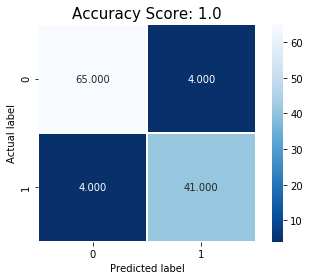

In [79]:
cm = metrics.confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

In [80]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.94      0.94      0.94        69
         1.0       0.91      0.91      0.91        45

    accuracy                           0.93       114
   macro avg       0.93      0.93      0.93       114
weighted avg       0.93      0.93      0.93       114



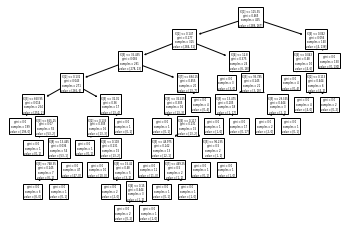

In [81]:
tree.plot_tree(model);

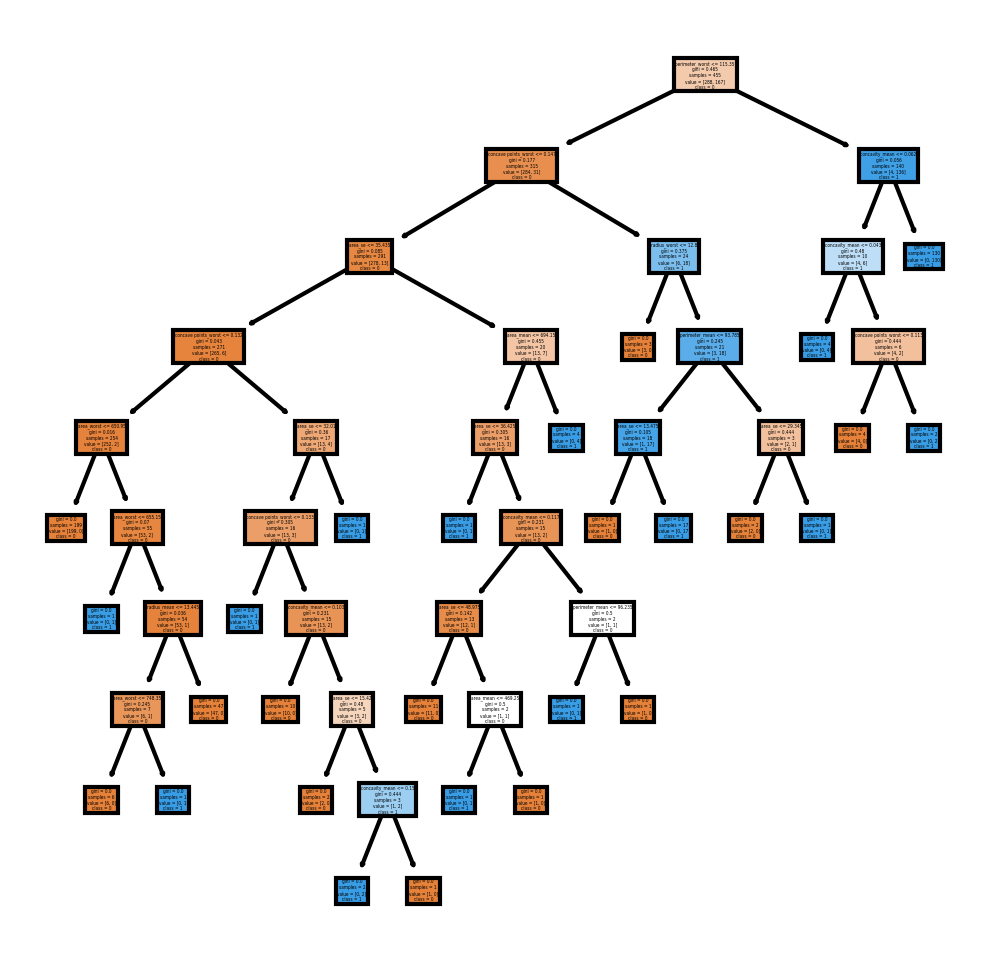

In [82]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=300)
tree.plot_tree(model, feature_names = x_train.columns, class_names = ['0', '1'], filled = True)
fig.savefig('imagename.png')

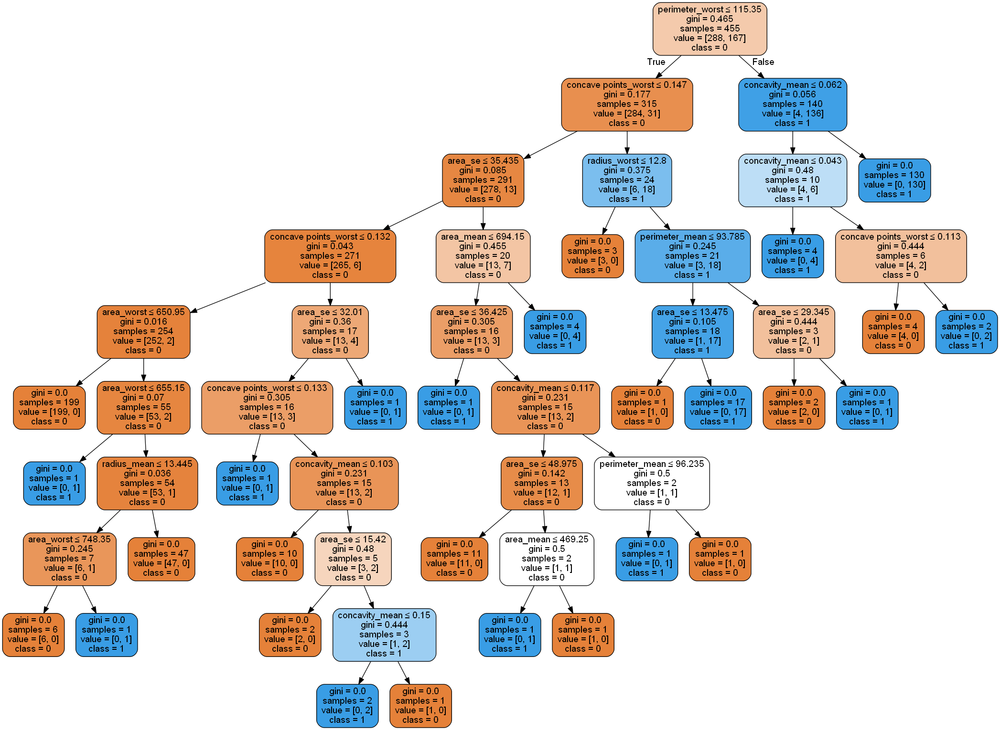

In [83]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns, class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('cancer decision tree.png')
Image(graph.create_png())

### Optimizing Decision Tree Performance
* criterion : optional (default=”gini”) or Choose attribute selection measure: This parameter allows us to use the different-different attribute selection measure. Supported criteria are “gini” for the Gini index and “entropy” for the information gain.
* splitter : string, optional (default=”best”) or Split Strategy: This parameter allows us to choose the split strategy. Supported strategies are “best” to choose the best split and “random” to choose the best random split.
* max_depth : int or None, optional (default=None) or Maximum Depth of a Tree: The maximum depth of the tree. If None, then nodes are expanded until all the leaves contain less than min_samples_split samples. The higher value of maximum depth causes overfitting, and a lower value causes underfitting (Source).

In Scikit-learn, optimization of decision tree classifier performed by only pre-pruning. Maximum depth of the tree can be used as a control variable for pre-pruning. In the following the example, you can plot a decision tree on the same data with max_depth=3. Other than pre-pruning parameters, You can also try other attribute selection measure such as entropy.

In [84]:
# Create Decision Tree classifer object
clf = tree.DecisionTreeClassifier(splitter = 'random', max_depth=4)

# Train Decision Tree Classifer
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Accuracy: 0.9385964912280702
              precision    recall  f1-score   support

         0.0       0.92      0.99      0.95        69
         1.0       0.97      0.87      0.92        45

    accuracy                           0.94       114
   macro avg       0.95      0.93      0.93       114
weighted avg       0.94      0.94      0.94       114



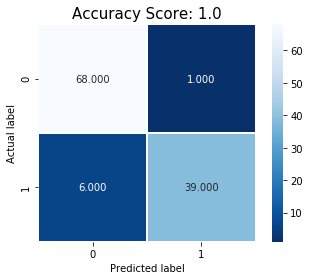

In [85]:
cm = metrics.confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

A little bit better than before

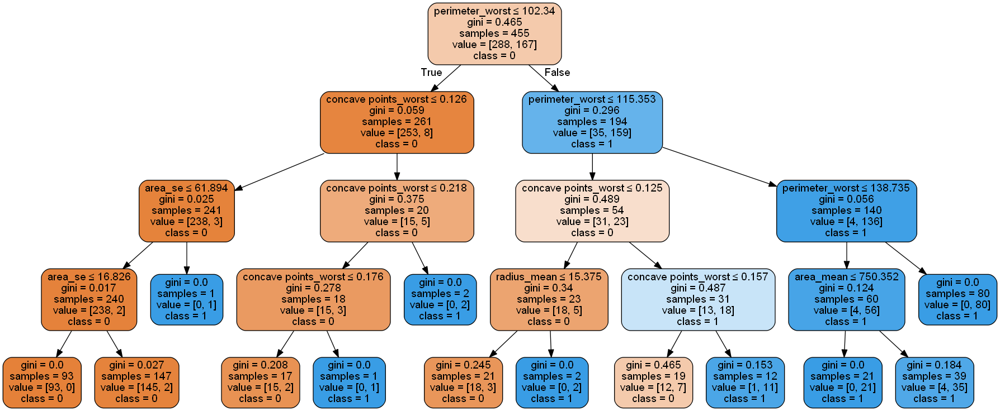

In [86]:
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns, class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('cancer decision tree.png')
Image(graph.create_png())

#### Pros
- Decision trees are easy to interpret and visualize.
- It can easily capture Non-linear patterns.
- It requires fewer data preprocessing from the user, for example, there is no need to normalize columns.
- It can be used for feature engineering such as predicting missing values, suitable for variable selection.
- The decision tree has no assumptions about distribution because of the non-parametric nature of the algorithm. (Source)

#### Cons
- Sensitive to noisy data. It can overfit noisy data.
- The small variation(or variance) in data can result in the different decision tree. This can be reduced by bagging and boosting algorithms.
- Decision trees are biased with imbalance dataset, so it is recommended that balance out the dataset before creating the decision tree.

# Support Vector Machines (SVM) Trial

In [91]:
#Import svm model
from sklearn import svm

#Create a svm Classifier
clf = svm.SVC(kernel='linear') # Linear Kernel

#Train the model using the training sets
clf.fit(x_train, y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [92]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Accuracy: 0.9649122807017544
              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97        69
         1.0       0.94      0.98      0.96        45

    accuracy                           0.96       114
   macro avg       0.96      0.97      0.96       114
weighted avg       0.97      0.96      0.97       114



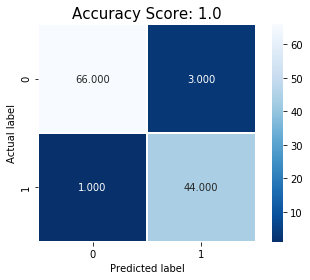

In [93]:
cm = metrics.confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

#### Advantages
SVM Classifiers offer good accuracy and perform faster prediction compared to Naïve Bayes algorithm. They also use less memory because they use a subset of training points in the decision phase. SVM works well with a clear margin of separation and with high dimensional space.

#### Disadvantages
SVM is not suitable for large datasets because of its high training time and it also takes more time in training compared to Naïve Bayes. It works poorly with overlapping classes and is also sensitive to the type of kernel used.

# Random Forests Trial

How does the algorithm work?
It works in four steps:

- Select random samples from a given dataset.
- Construct a decision tree for each sample and get a prediction result from each decision tree.
- Perform a vote for each predicted result.
- Select the prediction result with the most votes as the final prediction.

Random Forests vs Decision Trees
- Random forests is a set of multiple decision trees.
- Deep decision trees may suffer from overfitting, but random forests prevents overfitting by creating trees on random subsets.
- Decision trees are computationally faster.
- Random forests is difficult to interpret, while a decision tree is easily interpretable and can be converted to rules.

In [94]:
#Import Random Forest Model
from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(x_test)
clf.fit(x_train,y_train)

y_pred=clf.predict(x_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Accuracy: 0.9736842105263158
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98        69
         1.0       1.00      0.93      0.97        45

    accuracy                           0.97       114
   macro avg       0.98      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



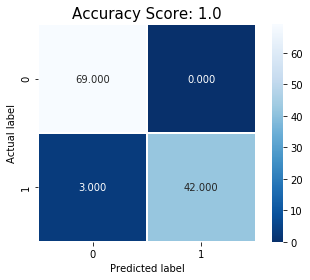

In [95]:
cm = metrics.confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

In [104]:
# feature_rf = pd.Series(clf.feature_importances_,index=X.columns).sort_values(ascending=False)
# feature_rf

feat_rf = pd.DataFrame(data = zip(X.columns, clf.feature_importances_),
                        columns = ['Feature', 'Importance']).nlargest(10, 'Importance')
feat_rf['RankRF'] = [i for i in range(1, 11)]
feat_rf

,Feature,Importance,RankRF
1,perimeter_worst,0.216118,1
4,radius_worst,0.184255,2
0,concave points_mean,0.172808,3
2,concave points_worst,0.141524,4
3,area_worst,0.080631,5
6,concavity_mean,0.062313,6
5,perimeter_mean,0.053049,7
7,area_mean,0.037088,8
9,area_se,0.027333,9
8,radius_mean,0.024882,10


No handles with labels found to put in legend.


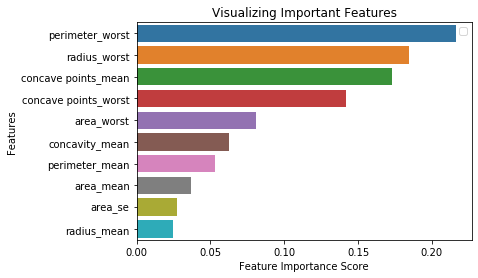

In [105]:
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

Let's remodel with bottom 3 feats removed

In [106]:
cancer_original = pd.DataFrame(X, columns = ['concave points_mean',
 'perimeter_worst',
 'concave points_worst',
 'area_worst',
 'radius_worst',
 'perimeter_mean',
 'concavity_mean'])
cancer_original['diagnosis'] = y

x_train, x_test, y_train, y_test = train_test_split(cancer_original.iloc[:, :7],
                                                cancer_original.iloc[:, -1],
                                                test_size = 0.20)

In [125]:
clf=RandomForestClassifier(n_estimators=100)
clf.fit(x_train,y_train)
y_pred=clf.predict(x_test)

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print(metrics.confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Accuracy: 0.9736842105263158
[[68  0]
 [ 3 43]]
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98        68
         1.0       1.00      0.93      0.97        46

    accuracy                           0.97       114
   macro avg       0.98      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



no  meaningful change in evaluation metrics.

In [129]:
feature_rf = pd.Series(clf.feature_importances_,index=x_train.columns).sort_values(ascending=False)
feature_rf

perimeter_worst         0.273659
area_worst              0.168638
concave points_worst    0.151657
radius_worst            0.146991
concave points_mean     0.127750
perimeter_mean          0.080661
concavity_mean          0.050646
dtype: float64

^ change in feat imp orders except perimeter_worst is still #1

In [ ]:
# Feature	Importance	RankRF
# 1	perimeter_worst	0.216118	1
# 4	radius_worst	0.184255	2
# 0	concave points_mean	0.172808	3
# 2	concave points_worst	0.141524	4
# 3	area_worst	0.080631	5
# 6	concavity_mean	0.062313	6
# 5	perimeter_mean	0.053049	7
# 7	area_mean	0.037088	8
# 9	area_se	0.027333	9
# 8	radius_mean	0.024882	10

#### Advantages:
- Random forests is considered as a highly accurate and robust method because of the number of decision trees participating in the process.
- It does not suffer from the overfitting problem. The main reason is that it takes the average of all the predictions, which cancels out the biases.
- The algorithm can be used in both classification and regression problems.
- Random forests can also handle missing values. There are two ways to handle these: using median values to replace continuous variables, and computing the proximity-weighted average of missing values.
- You can get the relative feature importance, which helps in selecting the most contributing features for the classifier.

#### Disadvantages:
- Random forests is slow in generating predictions because it has multiple decision trees. Whenever it makes a prediction, all the trees in the forest have to make a prediction for the same given input and then perform voting on it. This whole process is time-consuming.
- The model is difficult to interpret compared to a decision tree, where you can easily make a decision by following the path in the tree.